In [1]:
import os
import zarr
import random
import json
import warnings
import numpy as np
import pandas as pd
import torch.nn as nn
from pathlib import Path
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, Dataset
from collections import defaultdict
import sys
import torch
import torchvision.transforms.functional as F
import random

warnings.filterwarnings("ignore")
sys.path.append("./src/")

from src.config import CFG
from src.dataloader import (
    read_zarr,
    read_info_json,
    scale_coordinates,
    create_dataset,
    create_segmentation_map,
    EziiDataset,
    drop_padding,
)
from src.network import UNet_2D, aug
from src.utils import save_images
from src.metric import score, create_cls_pos, create_cls_pos_sikii, create_df
from metric import visualize_epoch_results

In [2]:
train_dataset = EziiDataset(
    exp_names=CFG.train_exp_names,
    base_dir="../../inputs/train/",
    particles_name=CFG.particles_name,
    resolution=CFG.resolution,
    zarr_type=CFG.train_zarr_types,
    train=True,
)

valid_dataset = EziiDataset(
    exp_names=CFG.valid_exp_names,
    base_dir="../../inputs/train/",
    particles_name=CFG.particles_name,
    resolution=CFG.resolution,
    zarr_type=CFG.valid_zarr_types,
    train=True,
)

from tqdm import tqdm

train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True, drop_last=True)
train_nshuffle_loader = DataLoader(train_dataset, batch_size=1, shuffle=False)
valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False)

for data in tqdm(train_dataset):
    normalized_tomogram = data["normalized_tomogram"]
    segmentation_map = data["segmentation_map"]
    break

# normalized_tomogram =
normalized_tomogram.shape[0]

[('TS_5_4', 'denoised'), ('TS_5_4', 'ctfdeconvolved'), ('TS_5_4', 'wbp'), ('TS_5_4', 'isonetcorrected'), ('TS_73_6', 'denoised'), ('TS_73_6', 'ctfdeconvolved'), ('TS_73_6', 'wbp'), ('TS_73_6', 'isonetcorrected'), ('TS_99_9', 'denoised'), ('TS_99_9', 'ctfdeconvolved'), ('TS_99_9', 'wbp'), ('TS_99_9', 'isonetcorrected'), ('TS_6_4', 'denoised'), ('TS_6_4', 'ctfdeconvolved'), ('TS_6_4', 'wbp'), ('TS_6_4', 'isonetcorrected'), ('TS_69_2', 'denoised'), ('TS_69_2', 'ctfdeconvolved'), ('TS_69_2', 'wbp'), ('TS_69_2', 'isonetcorrected')]
[('TS_86_3', 'denoised'), ('TS_6_6', 'denoised')]


  0%|          | 0/20 [00:00<?, ?it/s]


92

In [3]:
# torchのpadding用の関数
# torch.Size([4, 1, 158, 158]) -> torch.Size([4, 1, 160, 160])


class PadToSize(nn.Module):
    def __init__(self, resolution):
        super().__init__()
        if resolution == "0":
            self.size = 640
        elif resolution == "1":
            self.size = 320
        elif resolution == "2":
            self.size = 160

    def forward(self, x):
        return F.pad(x, (0, 0, self.size - x.shape[-1], self.size - x.shape[-2]))


# test
pad = PadToSize(CFG.resolution)
test_input = torch.randn((4, 1, 158, 158))
print(test_input.shape)
print(pad(test_input).shape)

torch.Size([4, 1, 158, 158])
torch.Size([4, 1, 320, 320])


In [4]:
model = UNet_2D().to("cuda")
model.load_state_dict(torch.load("./pretrained_model.pth"))
# model.eval()

<All keys matched successfully>

In [5]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# サンプルデータ
num_classes = len(CFG.particles_name)  # クラス数
colors = plt.cm.tab10(
    np.arange(len(CFG.particles_name))
)  # "tab10" カラーマップから色を取得

# ListedColormap を作成
class_colormap = ListedColormap(colors)


# カラーバー付きプロット
def plot_with_colormap(data, title, original_tomogram):
    masked_data = np.ma.masked_where(data <= 0, data)  # クラス0をマスク
    plt.imshow(original_tomogram, cmap="gray")
    im = plt.imshow(masked_data, cmap=class_colormap)
    plt.title(title)
    plt.axis("off")
    return im

In [6]:
class SegmentationLoss(nn.Module):
    def __init__(self, criterion):
        super().__init__()
        self.softmax = nn.Softmax(dim=1)
        self.criterion = criterion

    def forward(self, output, target):
        # output: (batch, cls, 160, 160)
        # target: (batch, 160, 160)

        # output, (batch, 160, 160, cls) -> (batch, 160, 160, cls)
        # output = output.permute(0, 2, 3, 1)
        # output = output.reshape(-1, output.shape[-1])  # (batch*160*160, cls)

        # target, (batch, 160, 160) -> (batch*160*160)
        # target = target.reshape(-1)

        loss = self.criterion(output, target)
        return loss


class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super().__init__()
        self.smooth = smooth

    def forward(self, output, target):
        """
        output: (batch, cls, height, width)
        target: (batch, height, width)
        """
        # Apply softmax to get probabilities
        output = nn.functional.softmax(output, dim=1)

        # One-hot encode the target to match the number of classes in output
        num_classes = output.shape[1]
        target_one_hot = (
            # F.one_hot(target, num_classes=num_classes).permute(0, 3, 1, 2).float()
            nn.functional.one_hot(target, num_classes=num_classes)
            .permute(0, 3, 1, 2)
            .float()
        )

        # Flatten for Dice calculation
        output_flat = output.reshape(output.shape[0], output.shape[1], -1)
        target_flat = target_one_hot.reshape(
            target_one_hot.shape[0], target_one_hot.shape[1], -1
        )

        # Compute intersection and union
        intersection = (output_flat * target_flat).sum(dim=2)
        union = output_flat.sum(dim=2) + target_flat.sum(dim=2)

        # Compute Dice score
        dice_score = (2.0 * intersection + self.smooth) / (union + self.smooth)

        # Average over classes and batch
        dice_loss = 1.0 - dice_score.mean()

        return dice_loss


# test
dice_loss = DiceLoss()
output = torch.randn((4, 3, 160, 160))
target = torch.randint(0, 3, (4, 160, 160))
print(dice_loss(output, target))

tensor(0.6663)


In [7]:
from transformers import get_cosine_schedule_with_warmup

batch_size = 8

optimizer = torch.optim.AdamW(model.parameters(), lr=CFG.lr)
# criterion = nn.CrossEntropyLoss(
#     #  weight=torch.tensor([2.0, 32, 32, 32, 32, 32, 32]).to("cuda")
# )
criterion = DiceLoss()
scheduler = get_cosine_schedule_with_warmup(
    optimizer,
    num_warmup_steps=CFG.epochs // 10,
    num_training_steps=CFG.epochs
    * len(train_loader)
    * (normalized_tomogram.shape[0] // batch_size),
    # * batch_size,
)
seg_loss = SegmentationLoss(criterion)
padf = PadToSize(CFG.resolution)

Train-Epoch: 0, Loss: 0.7254499646524588: : 240it [00:31,  7.60it/s]                       
Train-nshuffle-Epoch: 0, Loss: 0.7637165430771268: 100%|██████████| 1840/1840 [00:24<00:00, 73.71it/s] 


EPOCH: 0, TRAIN_SCORE: 0.044404514486108465, TRAIN_SCORE_LIST: [0.03995044322353234, 0.05327070752911526, 0.05404755150444952, 0.04152136057463667, 0.03323250959880852]


Valid-Epoch: 0, Loss: 0.734818272292614: 100%|██████████| 184/184 [00:02<00:00, 63.96it/s] 


EPOCH: 0, VALID_SCORE: 0.08626299528230567, VALID_SCORE_LIST: [0.09478181442490893, 0.07774417613970241]


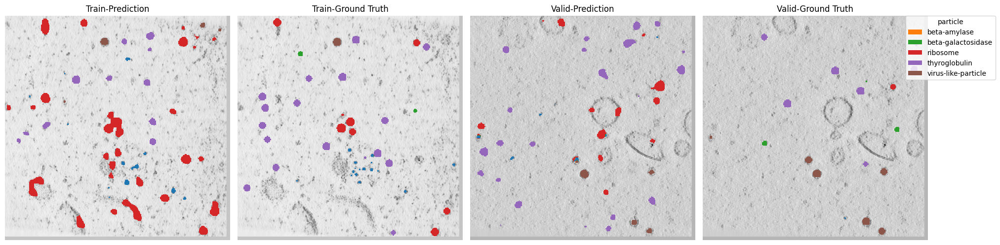

Train-Epoch: 1, Loss: 0.6827026136219502: : 240it [00:29,  8.02it/s]                       
Train-nshuffle-Epoch: 1, Loss: 0.7505957562638366: 100%|██████████| 1840/1840 [00:22<00:00, 81.97it/s] 


EPOCH: 1, TRAIN_SCORE: 0.06970851967584477, TRAIN_SCORE_LIST: [0.04542568435173479, 0.08544198477912358, 0.09378873749986817, 0.05830397494325252, 0.06558221680524481]


Valid-Epoch: 1, Loss: 0.7178611324533172: 100%|██████████| 184/184 [00:02<00:00, 70.32it/s]


EPOCH: 1, VALID_SCORE: 0.14100001711694132, VALID_SCORE_LIST: [0.1533436734081313, 0.12865636082575138]


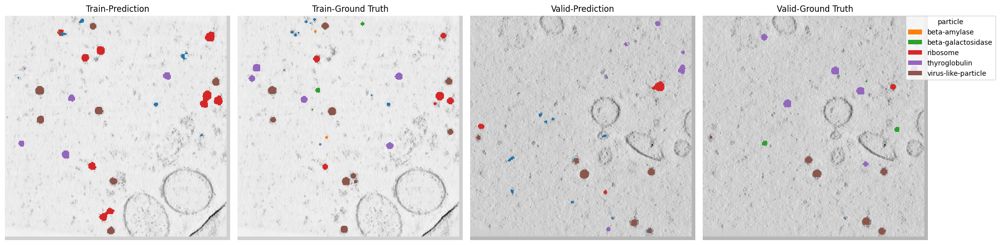

Train-Epoch: 2, Loss: 0.6493885785341262: : 240it [00:30,  8.00it/s]                       
Train-nshuffle-Epoch: 2, Loss: 0.7437723005595415: 100%|██████████| 1840/1840 [00:22<00:00, 82.57it/s] 


EPOCH: 2, TRAIN_SCORE: 0.1466616069601387, TRAIN_SCORE_LIST: [0.15033844329061277, 0.14439890309737077, 0.15077757158008823, 0.14101737613726034, 0.14677574069536142]


Valid-Epoch: 2, Loss: 0.7244971627774446: 100%|██████████| 184/184 [00:02<00:00, 65.30it/s] 


EPOCH: 2, VALID_SCORE: 0.3203296545312392, VALID_SCORE_LIST: [0.35028552547630865, 0.2903737835861698]


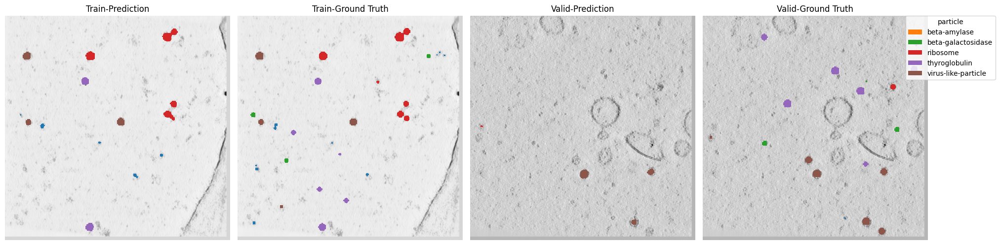

Train-Epoch: 3, Loss: 0.6234450188775857: : 240it [00:29,  8.05it/s]                       
Train-nshuffle-Epoch: 3, Loss: 0.727736611145994: 100%|██████████| 1840/1840 [00:22<00:00, 81.75it/s]  


EPOCH: 3, TRAIN_SCORE: 0.08997735008654158, TRAIN_SCORE_LIST: [0.07785687105558844, 0.10182053574252618, 0.09705674193634786, 0.08701052595815616, 0.08614207574008928]


Valid-Epoch: 3, Loss: 0.7304583276095598: 100%|██████████| 184/184 [00:02<00:00, 67.38it/s] 


EPOCH: 3, VALID_SCORE: 0.22250693067186245, VALID_SCORE_LIST: [0.2276776433870438, 0.21733621795668107]


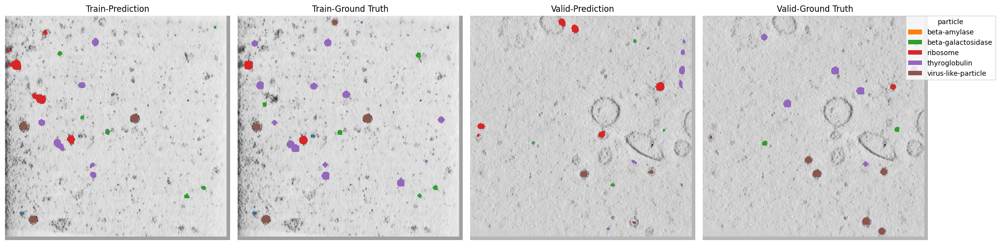

Train-Epoch: 4, Loss: 0.5918356130520502: : 240it [00:30,  7.96it/s]                       
Train-nshuffle-Epoch: 4, Loss: 0.7101693721893041: 100%|██████████| 1840/1840 [00:23<00:00, 79.55it/s] 


EPOCH: 4, TRAIN_SCORE: 0.15188969440266806, TRAIN_SCORE_LIST: [0.14179330516810013, 0.15645573889967282, 0.1539139887616347, 0.17030197544649836, 0.13698346373743436]


Valid-Epoch: 4, Loss: 0.7157368170826331: 100%|██████████| 184/184 [00:02<00:00, 72.52it/s] 


EPOCH: 4, VALID_SCORE: 0.23879027476185827, VALID_SCORE_LIST: [0.2681202648421162, 0.20946028468160036]


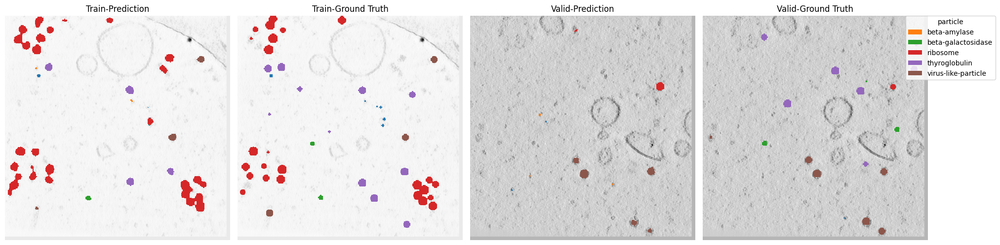

Train-Epoch: 5, Loss: 0.5596388993163903: : 240it [00:29,  8.03it/s]                       
Train-nshuffle-Epoch: 5, Loss: 0.7247611352283022: 100%|██████████| 1840/1840 [00:22<00:00, 80.52it/s] 


EPOCH: 5, TRAIN_SCORE: 0.10255795902296579, TRAIN_SCORE_LIST: [0.09000576918854816, 0.11093985402704218, 0.11394991445933407, 0.10788296626434955, 0.09001129117555498]


Valid-Epoch: 5, Loss: 0.7473016251688418: 100%|██████████| 184/184 [00:02<00:00, 67.74it/s] 


EPOCH: 5, VALID_SCORE: 0.17682267379575295, VALID_SCORE_LIST: [0.19276067272203037, 0.16088467486947552]


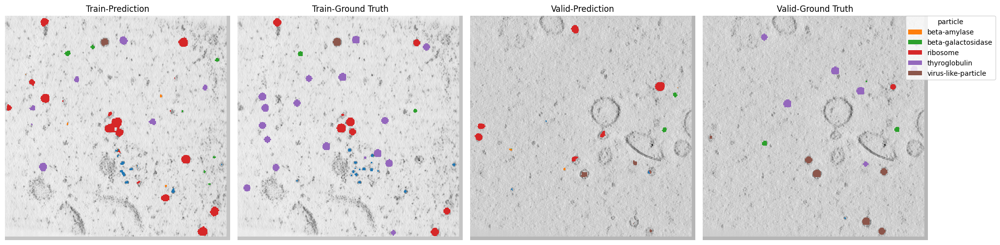

Train-Epoch: 6, Loss: 0.5278428614139556: : 240it [00:30,  7.98it/s]                       
Train-nshuffle-Epoch: 6, Loss: 0.6811099680869476: 100%|██████████| 1840/1840 [00:22<00:00, 82.46it/s] 


EPOCH: 6, TRAIN_SCORE: 0.057178344489572666, TRAIN_SCORE_LIST: [0.07554169537428837, 0.03952237347234847, 0.06796680273144011, 0.05822384230399597, 0.044637008565790406]


Valid-Epoch: 6, Loss: 0.8230810903984568: 100%|██████████| 184/184 [00:02<00:00, 62.42it/s] 


EPOCH: 6, VALID_SCORE: 0.10697631324189684, VALID_SCORE_LIST: [0.09391635667902475, 0.12003626980476893]


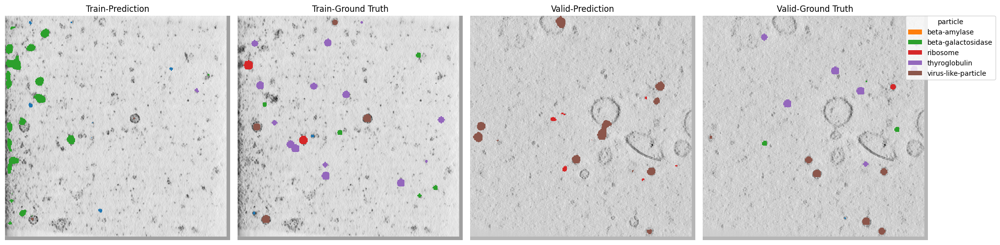

Train-Epoch: 7, Loss: 0.5095129668712616: : 240it [00:30,  8.00it/s]                       
Train-nshuffle-Epoch: 7, Loss: 0.6727117772983469: 100%|██████████| 1840/1840 [00:22<00:00, 81.91it/s] 


EPOCH: 7, TRAIN_SCORE: 0.2101649569831357, TRAIN_SCORE_LIST: [0.22902590555715263, 0.18565412389069852, 0.19867263729806015, 0.21602494237519873, 0.2214471757945685]


Valid-Epoch: 7, Loss: 0.7226122348852779: 100%|██████████| 184/184 [00:02<00:00, 65.22it/s] 


EPOCH: 7, VALID_SCORE: 0.25234746493232324, VALID_SCORE_LIST: [0.28987905730795166, 0.2148158725566948]


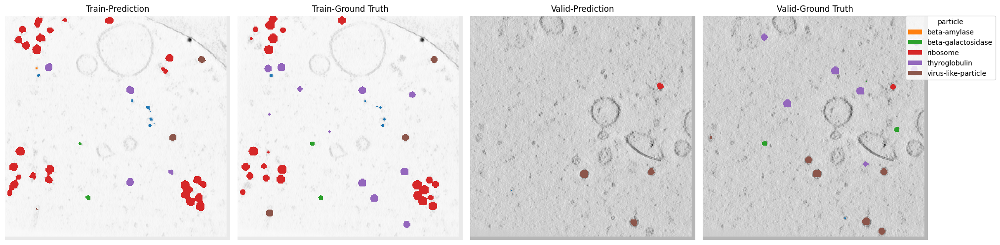

Train-Epoch: 8, Loss: 0.4938683740794659: : 240it [00:30,  7.94it/s]                        
Train-nshuffle-Epoch: 8, Loss: 0.6681724077657513: 100%|██████████| 1840/1840 [00:22<00:00, 82.32it/s] 


EPOCH: 8, TRAIN_SCORE: 0.21378289373759837, TRAIN_SCORE_LIST: [0.19595678324515875, 0.20314124017897964, 0.21912085872431122, 0.21058333725749498, 0.2401122492820473]


Valid-Epoch: 8, Loss: 0.7231296232861021: 100%|██████████| 184/184 [00:02<00:00, 63.81it/s]


EPOCH: 8, VALID_SCORE: 0.2833007692582483, VALID_SCORE_LIST: [0.3348597171882277, 0.23174182132826887]


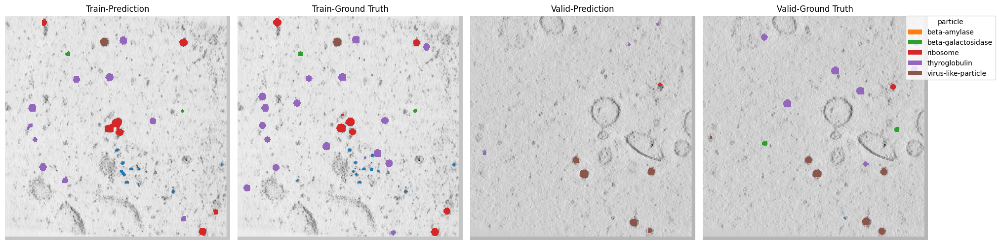

Train-Epoch: 9, Loss: 0.48195785482724507: : 240it [00:29,  8.16it/s]                       
Train-nshuffle-Epoch: 9, Loss: 0.6678862722995489: 100%|██████████| 1840/1840 [00:23<00:00, 79.76it/s] 


EPOCH: 9, TRAIN_SCORE: 0.29465669942132, TRAIN_SCORE_LIST: [0.2910892675819525, 0.2870018708790533, 0.2990382745717447, 0.2994188077464292, 0.2967352763274202]


Valid-Epoch: 9, Loss: 0.7311784683362298: 100%|██████████| 184/184 [00:02<00:00, 68.71it/s] 


EPOCH: 9, VALID_SCORE: 0.30386747718728424, VALID_SCORE_LIST: [0.2931350723305253, 0.31459988204404316]


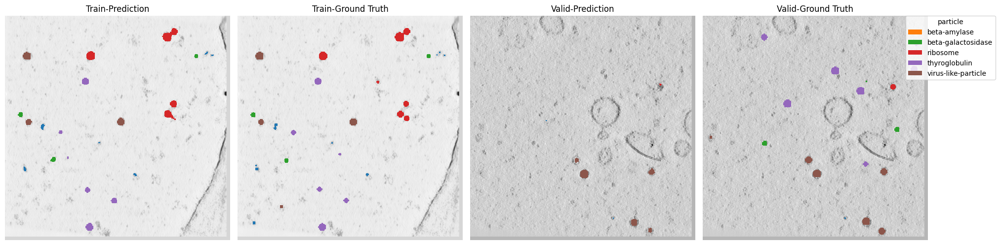

Train-Epoch: 10, Loss: 0.47222764814893403: : 240it [00:29,  8.05it/s]                       
Train-nshuffle-Epoch: 10, Loss: 0.6635405474706836: 100%|██████████| 1840/1840 [00:23<00:00, 79.16it/s] 


EPOCH: 10, TRAIN_SCORE: 0.2838235453349188, TRAIN_SCORE_LIST: [0.27919089967287913, 0.2695571385709382, 0.27215608843180883, 0.2765268781199937, 0.3216867218789741]


Valid-Epoch: 10, Loss: 0.7295324727892876: 100%|██████████| 184/184 [00:02<00:00, 67.03it/s]


EPOCH: 10, VALID_SCORE: 0.29448218031366696, VALID_SCORE_LIST: [0.3327564921634684, 0.2562078684638655]


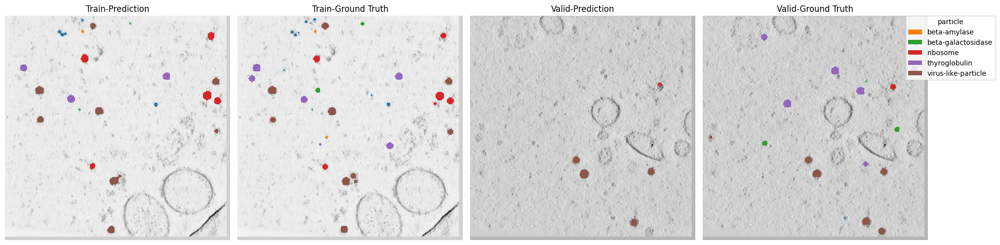

Train-Epoch: 11, Loss: 0.46613225191831587: : 240it [00:29,  8.13it/s]                       
Train-nshuffle-Epoch: 11, Loss: 0.6647288751019084: 100%|██████████| 1840/1840 [00:23<00:00, 79.52it/s] 


EPOCH: 11, TRAIN_SCORE: 0.09170125080735815, TRAIN_SCORE_LIST: [0.10170032148668715, 0.10057886677127859, 0.09342550167079626, 0.07376364955102492, 0.08903791455700383]


Valid-Epoch: 11, Loss: 0.8075724558337875: 100%|██████████| 184/184 [00:02<00:00, 63.82it/s]


EPOCH: 11, VALID_SCORE: 0.18574547625378918, VALID_SCORE_LIST: [0.17252033746325363, 0.19897061504432473]


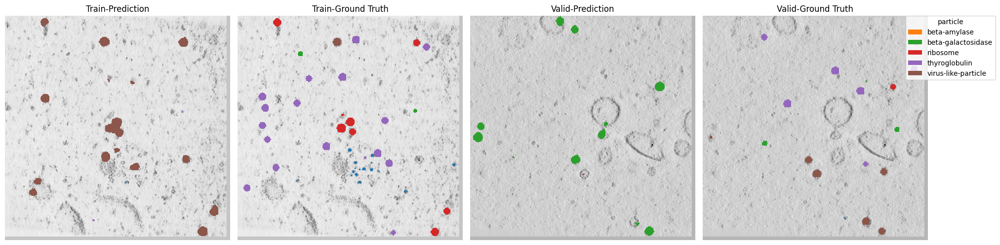

Train-Epoch: 12, Loss: 0.4625728361308575: : 240it [00:29,  8.12it/s]                        
Train-nshuffle-Epoch: 12, Loss: 0.6545456371553566: 100%|██████████| 1840/1840 [00:22<00:00, 81.23it/s] 


EPOCH: 12, TRAIN_SCORE: 0.2486887731644943, TRAIN_SCORE_LIST: [0.24279473994656092, 0.22279294600544217, 0.24236013746941867, 0.24901578602791613, 0.28648025637313373]


Valid-Epoch: 12, Loss: 0.7360174124655516: 100%|██████████| 184/184 [00:02<00:00, 63.42it/s]


EPOCH: 12, VALID_SCORE: 0.3038127311562808, VALID_SCORE_LIST: [0.33972991908886224, 0.26789554322369946]


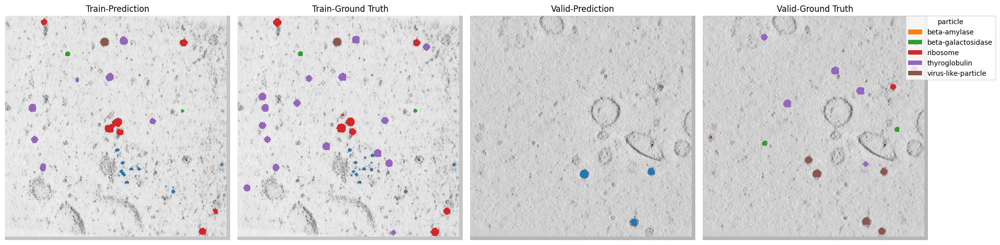

Train-Epoch: 13, Loss: 0.45561455711722376: : 240it [00:29,  8.07it/s]                       
Train-nshuffle-Epoch: 13, Loss: 0.6371593608804371: 100%|██████████| 1840/1840 [00:22<00:00, 81.38it/s] 


EPOCH: 13, TRAIN_SCORE: 0.13259695411906905, TRAIN_SCORE_LIST: [0.14352551045440612, 0.13477898697490506, 0.13499678773189924, 0.1345420570840462, 0.11514142835008859]


Valid-Epoch: 13, Loss: 0.7776901883923489: 100%|██████████| 184/184 [00:02<00:00, 65.16it/s]


EPOCH: 13, VALID_SCORE: 0.1984364835586277, VALID_SCORE_LIST: [0.2135666212557162, 0.18330634586153915]


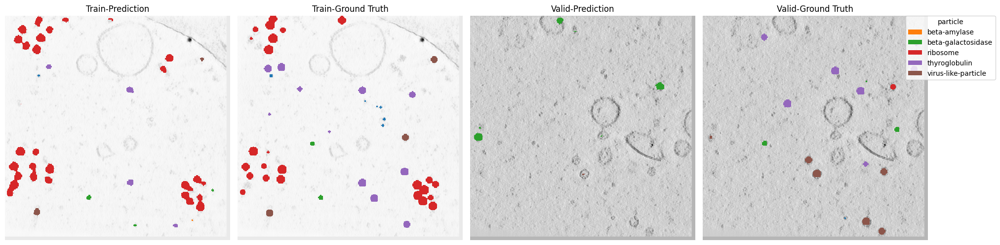

Train-Epoch: 14, Loss: 0.4512263355155786: : 240it [00:29,  8.05it/s]                        
Train-nshuffle-Epoch: 14, Loss: 0.6509960378641667: 100%|██████████| 1840/1840 [00:23<00:00, 77.76it/s] 


EPOCH: 14, TRAIN_SCORE: 0.2306491123251478, TRAIN_SCORE_LIST: [0.2332614003560122, 0.21140486304766376, 0.23863742814798808, 0.23379564675020462, 0.2361462233238702]


Valid-Epoch: 14, Loss: 0.73291373188081: 100%|██████████| 184/184 [00:02<00:00, 66.41it/s]  


EPOCH: 14, VALID_SCORE: 0.30237364969391123, VALID_SCORE_LIST: [0.2962836024748209, 0.3084636969130016]


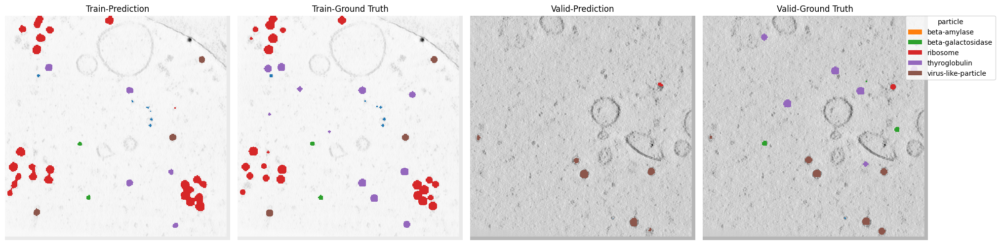

Train-Epoch: 15, Loss: 0.44878999864061675: : 240it [00:29,  8.09it/s]                       
Train-nshuffle-Epoch: 15, Loss: 0.6570152344910994: 100%|██████████| 1840/1840 [00:23<00:00, 78.87it/s] 


EPOCH: 15, TRAIN_SCORE: 0.22302346505334528, TRAIN_SCORE_LIST: [0.20485468350007946, 0.23298165828539244, 0.24206488533952794, 0.20721934084029697, 0.22799675730142938]


Valid-Epoch: 15, Loss: 0.7379704234392747: 100%|██████████| 184/184 [00:02<00:00, 67.22it/s] 


EPOCH: 15, VALID_SCORE: 0.27632798048910856, VALID_SCORE_LIST: [0.2932613426312522, 0.2593946183469649]


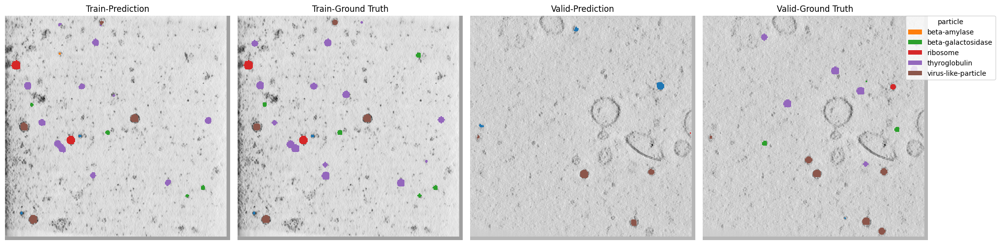

Train-Epoch: 16, Loss: 0.4437957470615705: : 240it [00:29,  8.14it/s]                        
Train-nshuffle-Epoch: 16, Loss: 0.6469150836700979: 100%|██████████| 1840/1840 [00:23<00:00, 79.22it/s] 


EPOCH: 16, TRAIN_SCORE: 0.21857211906693902, TRAIN_SCORE_LIST: [0.19803924781655938, 0.21935184565837593, 0.23281216201624305, 0.21297601316083645, 0.2296813266826802]


Valid-Epoch: 16, Loss: 0.723716625376888: 100%|██████████| 184/184 [00:02<00:00, 63.95it/s] 


EPOCH: 16, VALID_SCORE: 0.2647665700456139, VALID_SCORE_LIST: [0.302523535495356, 0.22700960459587183]


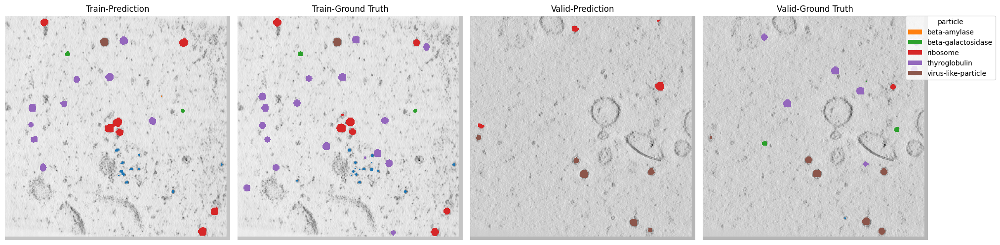

Train-Epoch: 17, Loss: 0.4415705695748329: : 240it [00:29,  8.10it/s]                        
Train-nshuffle-Epoch: 17, Loss: 0.6340223484713098: 100%|██████████| 1840/1840 [00:22<00:00, 81.46it/s] 


EPOCH: 17, TRAIN_SCORE: 0.07767923246894558, TRAIN_SCORE_LIST: [0.09485534931908292, 0.0829150386166477, 0.1006240827257606, 0.05788076452577672, 0.05212092715745992]


Valid-Epoch: 17, Loss: 0.8238696245395619: 100%|██████████| 184/184 [00:02<00:00, 66.72it/s]


EPOCH: 17, VALID_SCORE: 0.13777772329397117, VALID_SCORE_LIST: [0.12853475265651962, 0.14702069393142272]


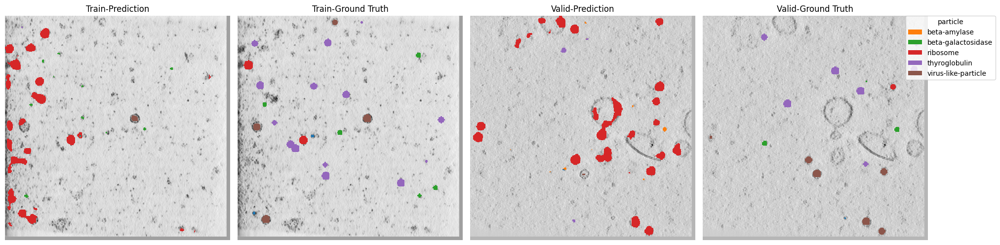

Train-Epoch: 18, Loss: 0.4415547716120879: : 240it [00:29,  8.16it/s]                        
Train-nshuffle-Epoch: 18, Loss: 0.6635759525324987: 100%|██████████| 1840/1840 [00:22<00:00, 82.63it/s] 


EPOCH: 18, TRAIN_SCORE: 0.3530144744457726, TRAIN_SCORE_LIST: [0.3932572159118333, 0.38723045527556893, 0.3330235094587475, 0.31780229242436864, 0.33375889915834467]


Valid-Epoch: 18, Loss: 0.753564787623675: 100%|██████████| 184/184 [00:02<00:00, 64.95it/s] 


EPOCH: 18, VALID_SCORE: 0.30357403317364484, VALID_SCORE_LIST: [0.3886272366032619, 0.21852082974402773]


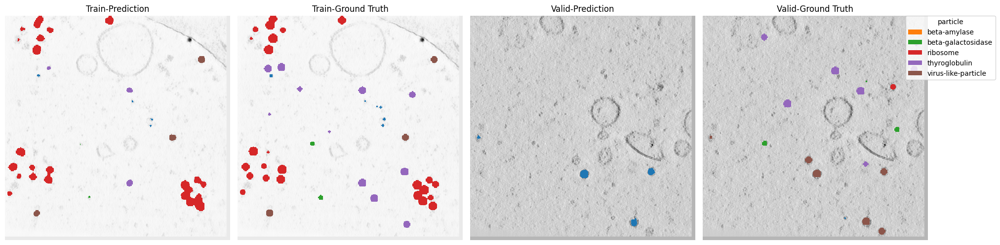

Train-Epoch: 19, Loss: 0.43736164371172587: : 240it [00:29,  8.08it/s]                       
Train-nshuffle-Epoch: 19, Loss: 0.6331336587667465: 100%|██████████| 1840/1840 [00:23<00:00, 79.40it/s] 


EPOCH: 19, TRAIN_SCORE: 0.05128816523833592, TRAIN_SCORE_LIST: [0.056467033500686256, 0.061491960081153964, 0.06286754070562821, 0.03710172917814091, 0.03851256272607025]


Valid-Epoch: 19, Loss: 0.8294398483374844: 100%|██████████| 184/184 [00:02<00:00, 64.61it/s]


EPOCH: 19, VALID_SCORE: 0.12591417240567127, VALID_SCORE_LIST: [0.08294299557649394, 0.1688853492348486]


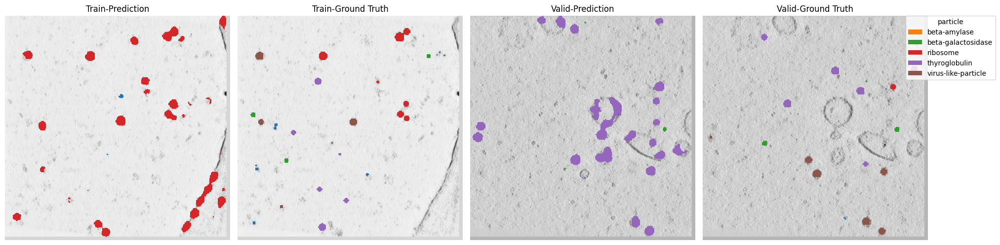

Train-Epoch: 20, Loss: 0.4361813426017761: : 240it [00:29,  8.00it/s]                        
Train-nshuffle-Epoch: 20, Loss: 0.6419505608470544: 100%|██████████| 1840/1840 [00:23<00:00, 78.64it/s] 


EPOCH: 20, TRAIN_SCORE: 0.23452954351065136, TRAIN_SCORE_LIST: [0.22115850752372682, 0.21739285483953913, 0.2487526332298065, 0.2274548448720657, 0.2578888770881186]


Valid-Epoch: 20, Loss: 0.7255886653843133: 100%|██████████| 184/184 [00:02<00:00, 66.88it/s]


EPOCH: 20, VALID_SCORE: 0.25864963715886347, VALID_SCORE_LIST: [0.29923074174338454, 0.2180685325743424]


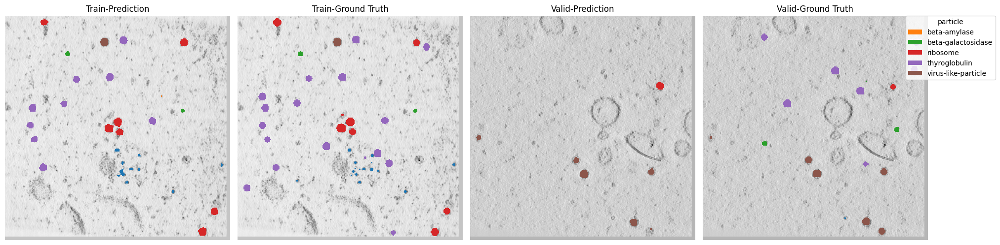

Train-Epoch: 21, Loss: 0.43204969316720965: : 240it [00:29,  8.01it/s]                       
Train-nshuffle-Epoch: 21, Loss: 0.6313644228098185: 100%|██████████| 1840/1840 [00:22<00:00, 80.78it/s] 


EPOCH: 21, TRAIN_SCORE: 0.13935743240278603, TRAIN_SCORE_LIST: [0.1258018432062957, 0.1518223910080842, 0.15831617235272272, 0.1502734462998148, 0.11057330914701279]


Valid-Epoch: 21, Loss: 0.7716594892351524: 100%|██████████| 184/184 [00:02<00:00, 64.70it/s]


EPOCH: 21, VALID_SCORE: 0.17708536858714571, VALID_SCORE_LIST: [0.19632647047481555, 0.15784426669947588]


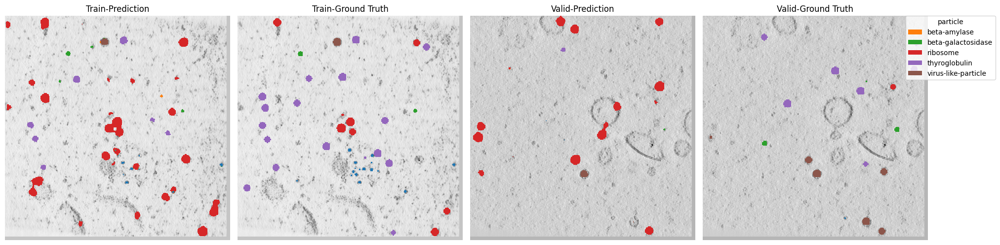

Train-Epoch: 22, Loss: 0.4311932216087977: : 240it [00:29,  8.01it/s]                        
Train-nshuffle-Epoch: 22, Loss: 0.6319133914683176: 100%|██████████| 1840/1840 [00:23<00:00, 78.29it/s] 


EPOCH: 22, TRAIN_SCORE: 0.05942005517075174, TRAIN_SCORE_LIST: [0.06122480010799743, 0.0589203577353467, 0.07657335843395163, 0.04630638859491297, 0.054075370981549985]


Valid-Epoch: 22, Loss: 0.8221838513146276: 100%|██████████| 184/184 [00:03<00:00, 60.87it/s]


EPOCH: 22, VALID_SCORE: 0.14747767601770728, VALID_SCORE_LIST: [0.15195148365541603, 0.14300386837999857]


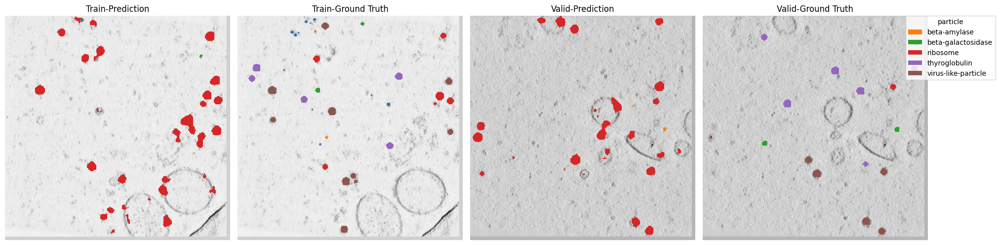

Train-Epoch: 23, Loss: 0.4278642100592454: : 240it [00:29,  8.06it/s]                        
Train-nshuffle-Epoch: 23, Loss: 0.6456855681927308: 100%|██████████| 1840/1840 [00:23<00:00, 76.85it/s] 


EPOCH: 23, TRAIN_SCORE: 0.23925174079769113, TRAIN_SCORE_LIST: [0.22139264582459875, 0.2331908548032606, 0.27005660862229214, 0.2353177615804561, 0.23630083315784806]


Valid-Epoch: 23, Loss: 0.7367362736359887: 100%|██████████| 184/184 [00:02<00:00, 66.63it/s]


EPOCH: 23, VALID_SCORE: 0.2715556400251703, VALID_SCORE_LIST: [0.30527540982362567, 0.2378358702267149]


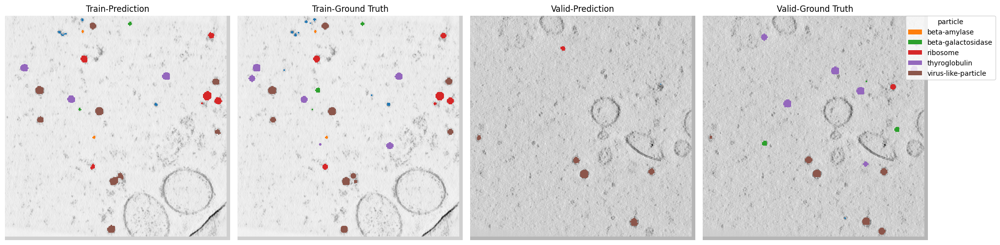

Train-Epoch: 24, Loss: 0.4279067821800709: : 240it [00:29,  8.06it/s]                        
Train-nshuffle-Epoch: 24, Loss: 0.6181550001968508: 100%|██████████| 1840/1840 [00:23<00:00, 78.71it/s] 


EPOCH: 24, TRAIN_SCORE: 0.11726776390350624, TRAIN_SCORE_LIST: [0.13255410372840762, 0.13695269314750003, 0.12186064206410367, 0.08613441814102756, 0.10883696243649237]


Valid-Epoch: 24, Loss: 0.7908433371264002: 100%|██████████| 184/184 [00:02<00:00, 65.91it/s] 


EPOCH: 24, VALID_SCORE: 0.17540454889099852, VALID_SCORE_LIST: [0.18068705231720297, 0.17012204546479406]


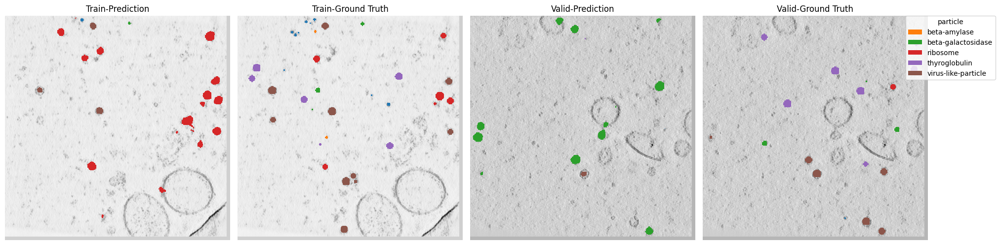

Train-Epoch: 25, Loss: 0.42803082341949145: : 240it [00:29,  8.10it/s]                       
Train-nshuffle-Epoch: 25, Loss: 0.6383301824979161: 100%|██████████| 1840/1840 [00:23<00:00, 79.71it/s] 


EPOCH: 25, TRAIN_SCORE: 0.2622861102736775, TRAIN_SCORE_LIST: [0.2692937209680116, 0.28246537168492997, 0.2776465397631576, 0.2327089223473852, 0.24931599660490292]


Valid-Epoch: 25, Loss: 0.7288419973591099: 100%|██████████| 184/184 [00:02<00:00, 66.24it/s]


EPOCH: 25, VALID_SCORE: 0.2552872137315895, VALID_SCORE_LIST: [0.2780086295184708, 0.23256579794470827]


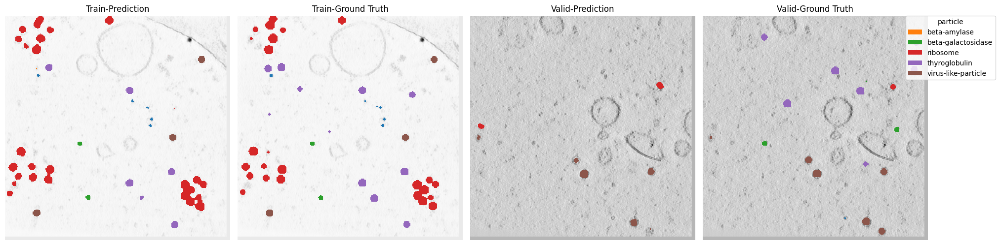

Train-Epoch: 26, Loss: 0.4275299236178398: : 240it [00:29,  8.10it/s]                        
Train-nshuffle-Epoch: 26, Loss: 0.6186079963698716:  85%|████████▍ | 1563/1840 [00:19<00:02, 105.19it/s]

In [ ]:
best_model = None
best_score = 0

for epoch in range(CFG.epochs):
    train_loss = []
    train_nshuffle_loss = []
    valid_loss = []

    # train_original_tomogram = defaultdict(list)
    ##train_pred_tomogram = defaultdict(list)
    # train_gt_tomogram = defaultdict(list)

    train_nshuffle_original_tomogram = defaultdict(list)
    train_nshuffle_pred_tomogram = defaultdict(list)
    train_nshuffle_gt_tomogram = defaultdict(list)

    valid_original_tomogram = defaultdict(list)
    valid_pred_tomogram = defaultdict(list)
    valid_gt_tomogram = defaultdict(list)

    model.train()
    tq = tqdm(range(len(train_loader) * normalized_tomogram.shape[0] // batch_size))
    for data in train_loader:
        exp_name = data["exp_name"][0]
        tomogram = data["normalized_tomogram"]
        segmentation_map = data["segmentation_map"]

        tomogram = tomogram.reshape(1, -1, tomogram.shape[-2], tomogram.shape[-1])
        segmentation_map = segmentation_map.reshape(
            1, -1, segmentation_map.shape[-2], segmentation_map.shape[-1]
        )

        random_index = torch.randperm(tomogram.shape[1])

        for i in range(0, tomogram.shape[1], batch_size):
            optimizer.zero_grad()
            input_ = (
                tomogram[:, random_index[i : i + batch_size]].to("cuda").transpose(0, 1)
            )
            gt = (
                segmentation_map[:, random_index[i : i + batch_size]]
                .to("cuda")
                .long()
                .squeeze()
            )
            # print(input_.shape, gt.shape)

            input_ = padf(input_)
            gt = padf(gt)
            # input_, gt = aug(input_, gt)
            output = model(input_)
            loss = seg_loss(output, gt)
            loss.backward()
            optimizer.step()
            scheduler.step()

            train_loss.append(loss.item())
            tq.set_description(f"Train-Epoch: {epoch}, Loss: {np.mean(train_loss)}")
            tq.update(1)

            # print(output.shape, gt.shape) # torch.Size([1, 7, 160, 160]) torch.Size([1, 160, 160])
            # train_pred_tomogram[exp_name].append(output.cpu().detach().numpy())
            # train_gt_tomogram[exp_name].append(gt.cpu().detach().numpy())
    tq.close()
    train_exp_name = exp_name

    ######################################## train-nshuffle #########################################
    model.eval()
    tq = tqdm(range(len(train_nshuffle_loader) * normalized_tomogram.shape[0]))
    for data in train_nshuffle_loader:
        exp_name = data["exp_name"][0]
        tomogram = data["normalized_tomogram"].to("cuda")
        segmentation_map = data["segmentation_map"].to("cuda").long()

        train_nshuffle_original_tomogram[exp_name] = (
            padf(tomogram).squeeze().cpu().detach().numpy()
        )

        for i in range(tomogram.shape[1]):
            input_ = tomogram[:, i].unsqueeze(0)
            gt = segmentation_map[:, i]

            input_ = padf(input_)
            gt = padf(gt)
            output = model(input_)
            loss = seg_loss(output, gt)

            train_nshuffle_loss.append(loss.item())
            tq.set_description(
                f"Train-nshuffle-Epoch: {epoch}, Loss: {np.mean(train_nshuffle_loss)}"
            )
            tq.update(1)

            # print(output.shape, gt.shape) # torch.Size([1, 7, 160, 160]) torch.Size([1, 160, 160])
            train_nshuffle_pred_tomogram[exp_name].append(output.cpu().detach().numpy())
            train_nshuffle_gt_tomogram[exp_name].append(gt.cpu().detach().numpy())
    tq.close()

    train_score_, train_score_list = visualize_epoch_results(
        train_nshuffle_pred_tomogram,
        base_dir="../../inputs/train/overlay/ExperimentRuns/",
        sikii_dict=CFG.initial_sikii,
    )
    print(
        f"EPOCH: {epoch}, TRAIN_SCORE: {train_score_}, TRAIN_SCORE_LIST: {train_score_list}"
    )

    ############################################# valid #############################################

    model.eval()
    tq = tqdm(range(len(valid_loader) * normalized_tomogram.shape[0]))
    for data in valid_loader:
        exp_name = data["exp_name"][0]
        tomogram = data["normalized_tomogram"].to("cuda")
        segmentation_map = data["segmentation_map"].to("cuda").long()

        valid_original_tomogram[exp_name] = (
            padf(tomogram).squeeze().cpu().detach().numpy()
        )

        for i in range(tomogram.shape[1]):
            input_ = tomogram[:, i].unsqueeze(0)
            gt = segmentation_map[:, i]

            input_ = padf(input_)
            gt = padf(gt)
            output = model(input_)
            loss = seg_loss(output, gt)

            valid_loss.append(loss.item())
            tq.set_description(f"Valid-Epoch: {epoch}, Loss: {np.mean(valid_loss)}")
            tq.update(1)

            # print(output.shape, gt.shape) # torch.Size([1, 7, 160, 160]) torch.Size([1, 160, 160])
            valid_pred_tomogram[exp_name].append(output.cpu().detach().numpy())
            valid_gt_tomogram[exp_name].append(gt.cpu().detach().numpy())
    tq.close()
    valid_exp_name = exp_name

    valid_score_, valid_score_list = visualize_epoch_results(
        valid_pred_tomogram,
        base_dir="../../inputs/train/overlay/ExperimentRuns/",
        sikii_dict=CFG.initial_sikii,
    )

    print(
        f"EPOCH: {epoch}, VALID_SCORE: {valid_score_}, VALID_SCORE_LIST: {valid_score_list}"
    )
    if valid_score_ > best_score:
        best_score = valid_score_
        best_model = model
        torch.save(model.state_dict(), f"best_model.pth")

    # 描画
    index = 30
    plt.figure(figsize=(20, 5))

    # Train-Pred-Plot
    ax = plt.subplot(1, 4, 1)
    pred = train_nshuffle_pred_tomogram[train_exp_name][index][0].argmax(0)
    plot_with_colormap(
        pred,
        "Train-Prediction",
        train_nshuffle_original_tomogram[train_exp_name][index],
    )

    # Train-GT-Plot
    ax = plt.subplot(1, 4, 2)
    gt = train_nshuffle_gt_tomogram[train_exp_name][index][0]
    plot_with_colormap(
        gt,
        "Train-Ground Truth",
        train_nshuffle_original_tomogram[train_exp_name][index],
    )

    # Valid-Pred-Plot
    ax = plt.subplot(1, 4, 3)
    pred = valid_pred_tomogram[valid_exp_name][index][0].argmax(0)
    plot_with_colormap(
        pred, "Valid-Prediction", valid_original_tomogram[valid_exp_name][index]
    )

    # Valid-GT-Plot
    ax = plt.subplot(1, 4, 4)
    gt = valid_gt_tomogram[valid_exp_name][index][0]
    plot_with_colormap(
        gt, "Valid-Ground Truth", valid_original_tomogram[valid_exp_name][index]
    )

    # 凡例を追加
    legend_elements = [
        Patch(facecolor=colors[i], label=CFG.particles_name[i])
        for i in range(1, num_classes)
    ]
    plt.legend(
        handles=legend_elements,
        loc="upper right",
        title="particle",
        bbox_to_anchor=(1.3, 1),  # 凡例を右上に配置
        borderaxespad=0,
    )

    plt.tight_layout()
    plt.show()

    # torch.save(model.state_dict(), "pretrained_model.pth")